# A Demo of IML-ViT

This notebook provides a example of our training & inference pipeline of how to apply IML-ViT to image manipulation localization tasks.

### Requirements
You should install the requirements in `./requirements.txt` and manually install following requirements before run this note book：
- PyTorch
- OpenCV (cv2)

### Load Dataset
- We defined two types of Dataset class
  - `json_dataset`, which get input image and correspoding groundtruth from a json file with protocol like this:
    ```
    [
        [
          "/Dataset/CASIAv1/Tp/image1.jpg",
          "/Dataset/CASIAv2/Gt/image1.jpg"
        ],
        [
          "/Dataset/CASIAv1/Tp/image2.jpg",
          "Negative"
        ],
        ......
    ]
    ```
    where "Negative" represent a totally black groundtruth that don't needs a path(all authentic)
  - `mani_dataset` which loads image and groundtruth pairs automaticlly from a directory having sub-directories named as `Tp` (for input images) and `Gt` |(for groundtruths). This class will use sorted `os.listdir()` function to generate the pairs. 
- These datasets will do **zero-padding** automatically. Common augumentation method like ImageNet normalization will also be added.
- Both datasets can generate `edge_mask` when specify the `edge_width` parameter. Then, this dataset will return 3 objects (image, GT, edge mask) while only 2 objects when `edge_width=None`.
- For inference, returing the actual shape of the original image is crucial. You can set `if_return_shape=True` to get this value. 

In [1]:
# Pre-import and set for a clear ploting
from matplotlib import pyplot as plt
plt.rcParams['figure.dpi'] = 60
plt.rcParams['font.size'] = 10
plt.rcParams['figure.figsize'] = (24, 6)
from utils.datasets import mani_dataset # special Dataset class

In [2]:
# here we use mani dataset as example
input_dir = "./images/sample_iml_dataset/"
dataset = mani_dataset(
    path = input_dir,
    edge_width=7, # specify the edge mask, other wise only return 2 objects
    if_return_shape=True
)
print(dataset)
print(f":ength of this dataset: {len(dataset)}")

:ength of this dataset: 23


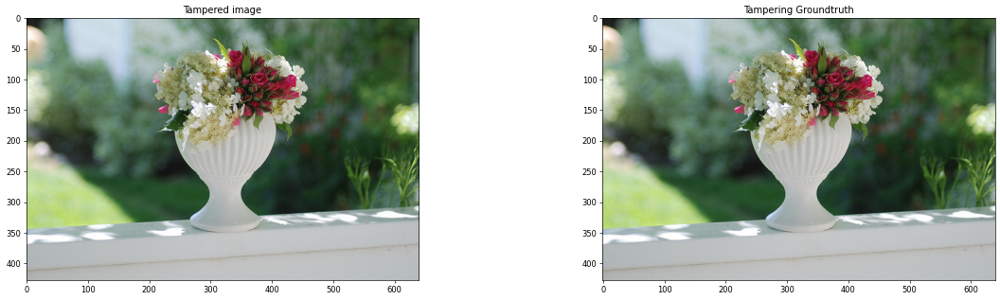

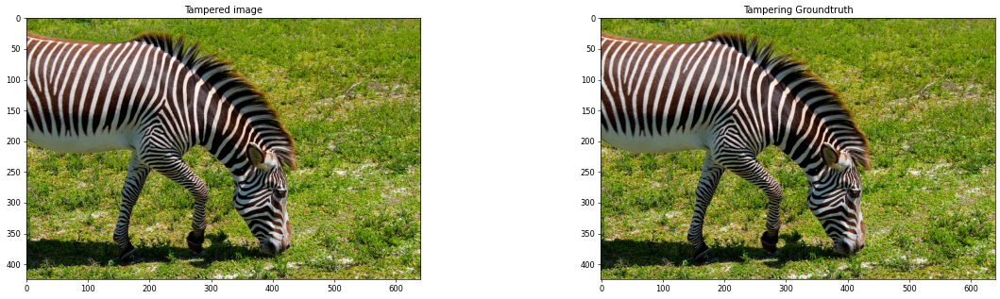

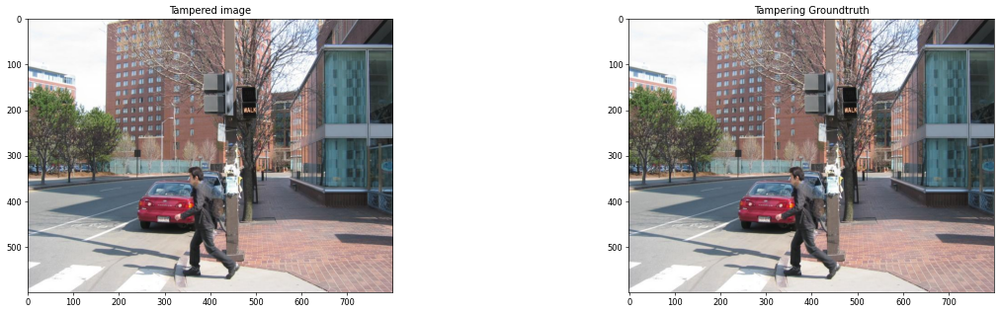

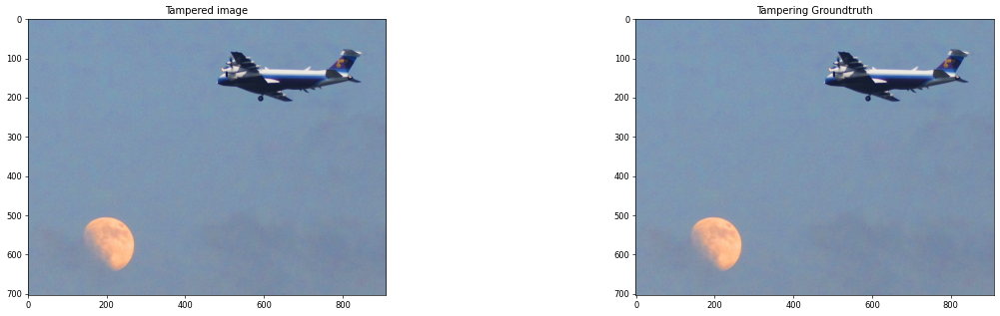

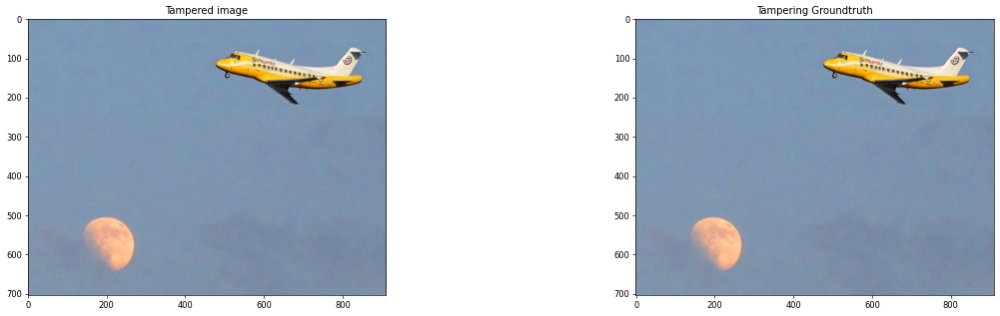

...

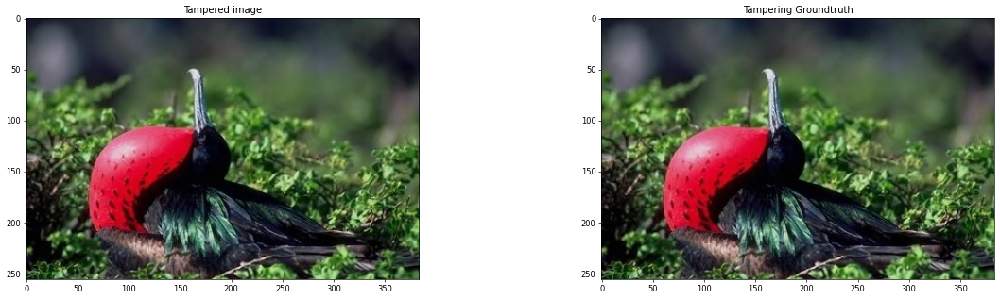

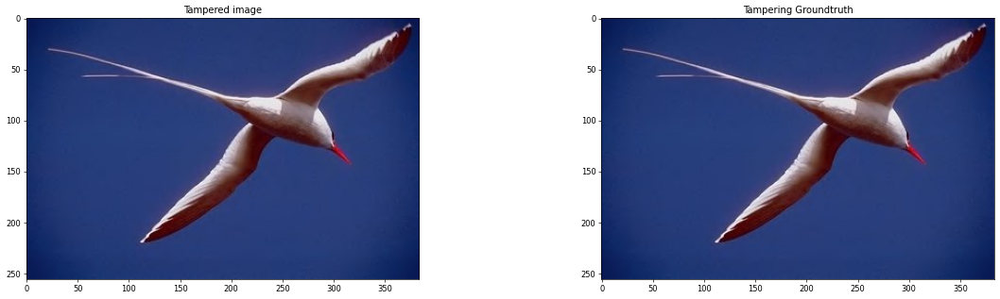

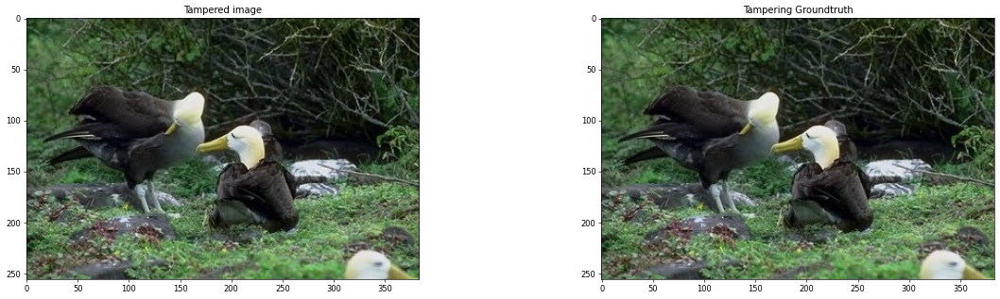

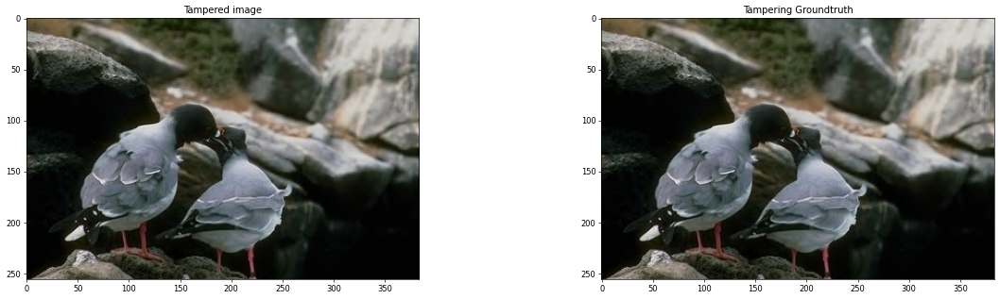

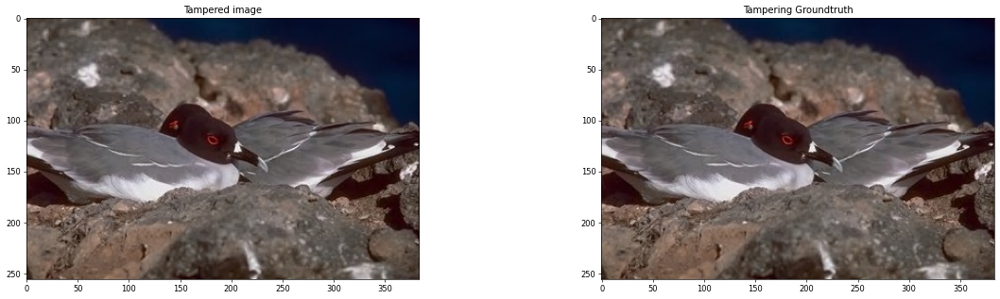

In [3]:
# Visualize datas without any augmentation
for img, gt in zip(dataset.tp_path, dataset.gt_path):
    img = plt.imread(img)
    gt = plt.imread(gt)
    plt.subplot(1, 2, 1)
    plt.title("Tampered image")
    plt.imshow(img)
    plt.subplot(1, 2, 2)
    plt.title("Tampering Groundtruth")
    plt.imshow(gt, cmap="gray")
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


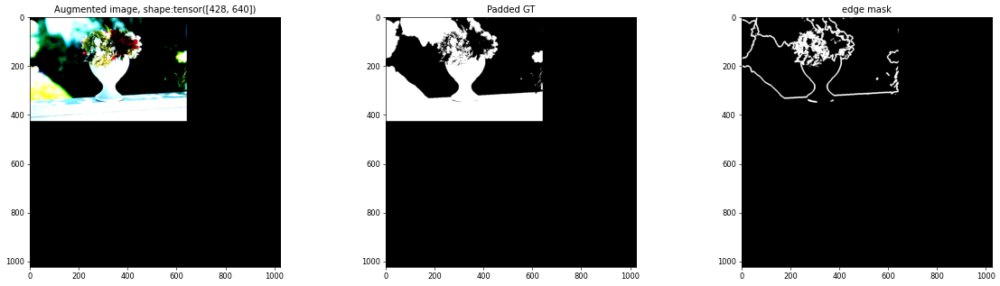

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


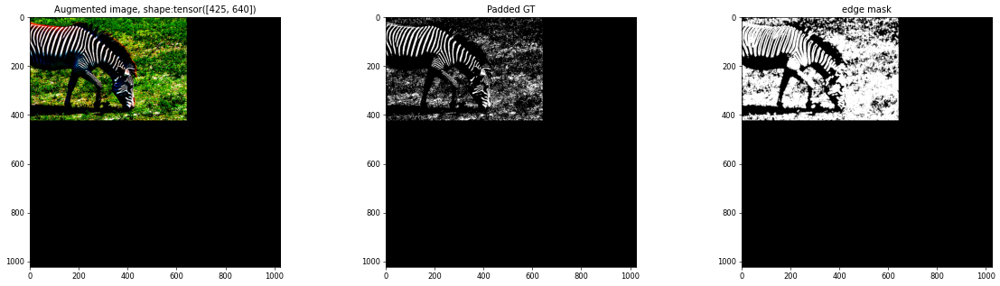

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


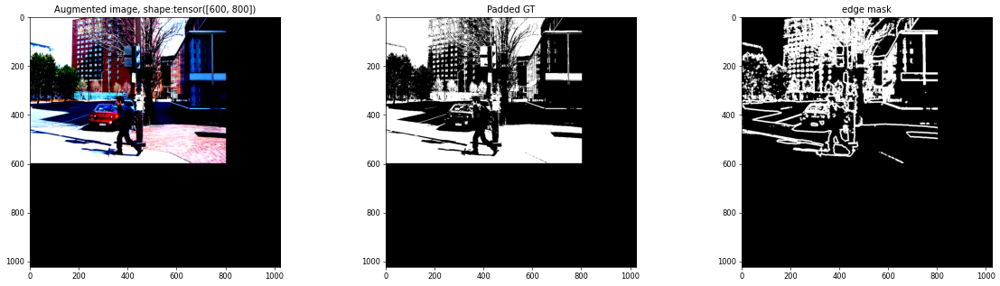

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


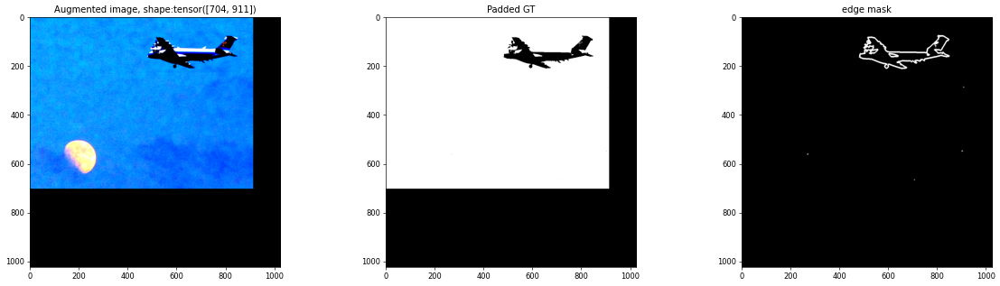

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


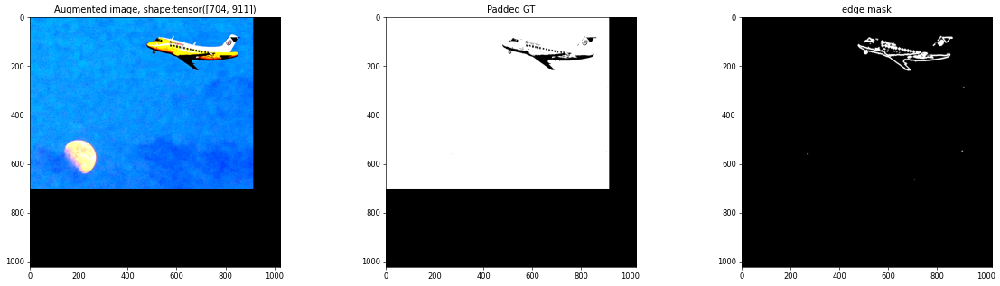

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


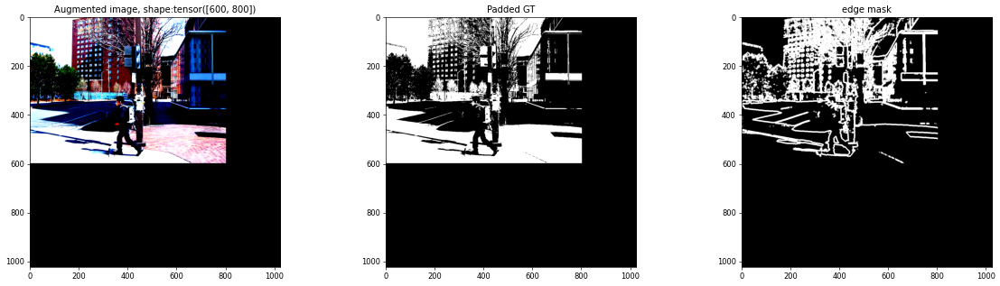

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


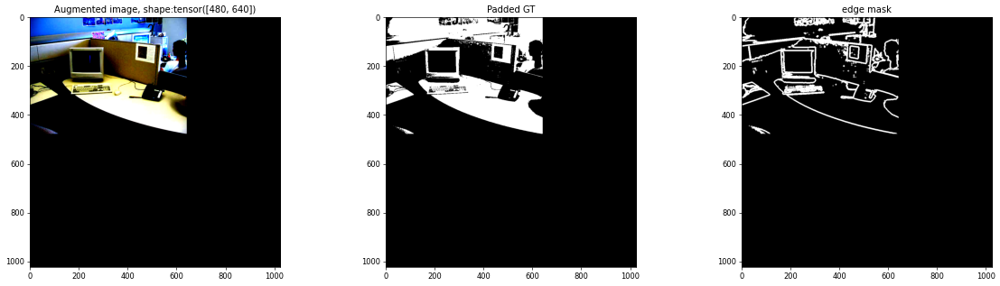

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


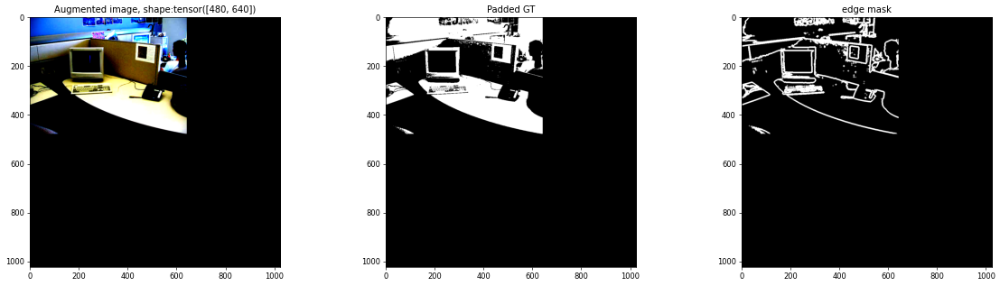

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


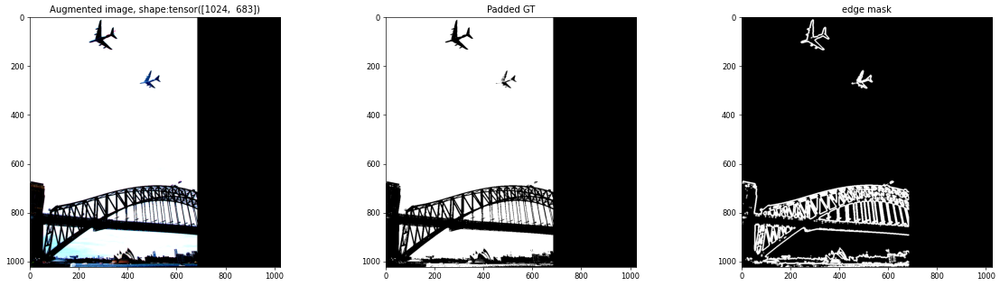

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


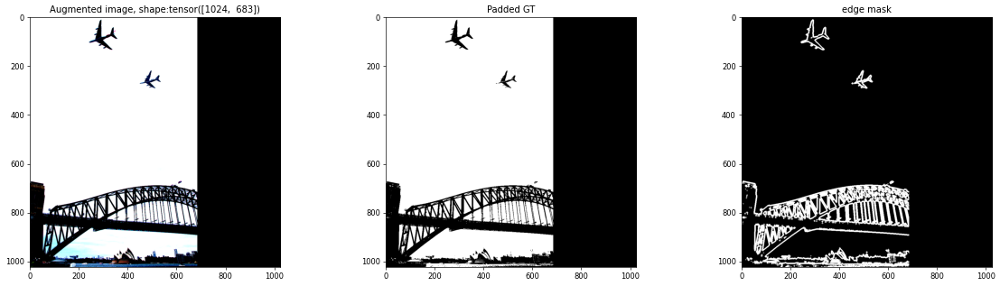

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


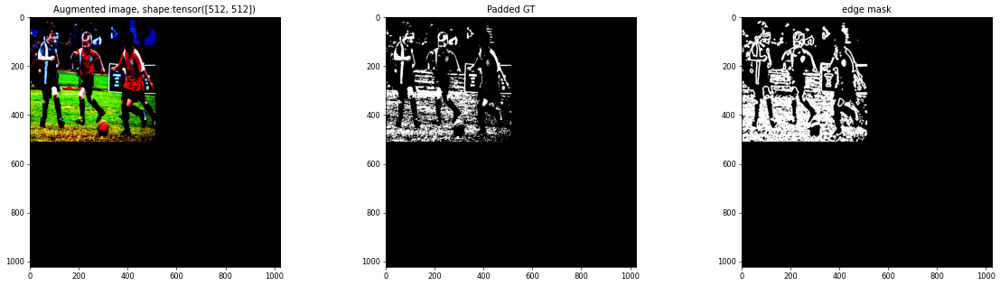

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


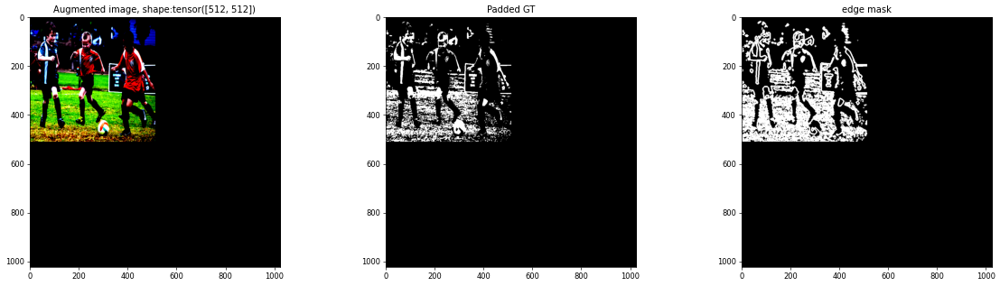

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


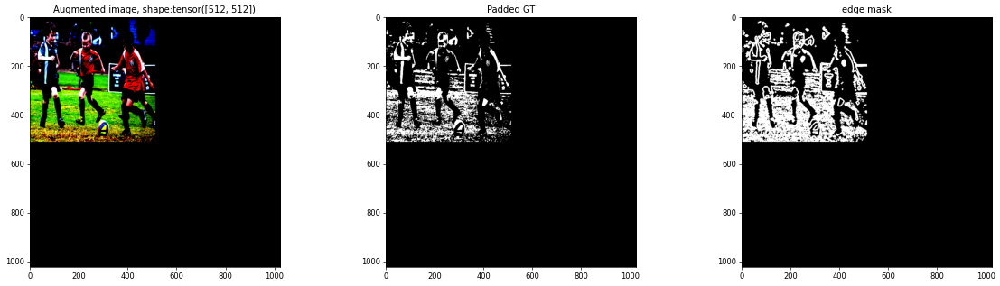

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


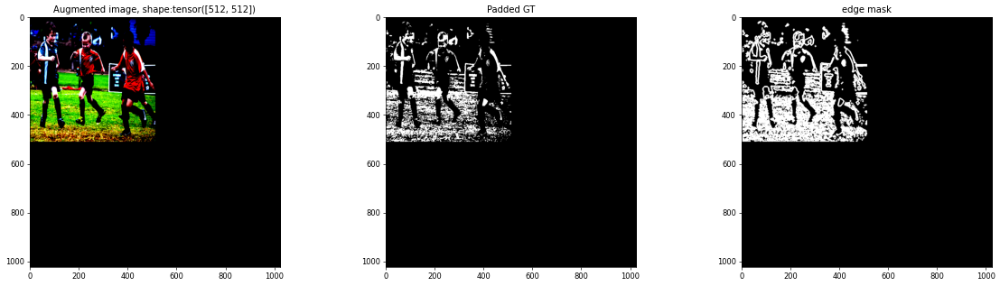

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


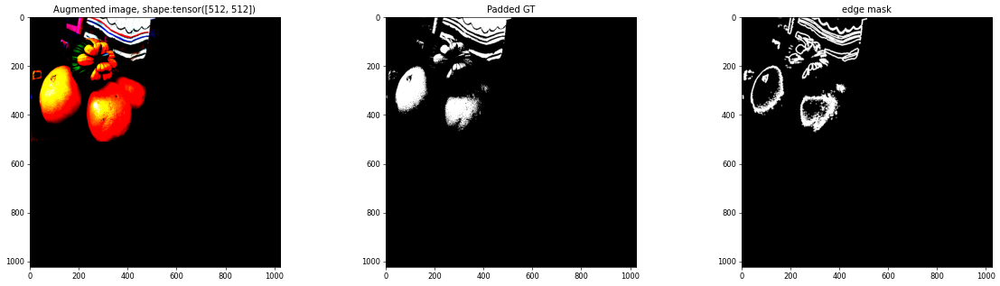

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


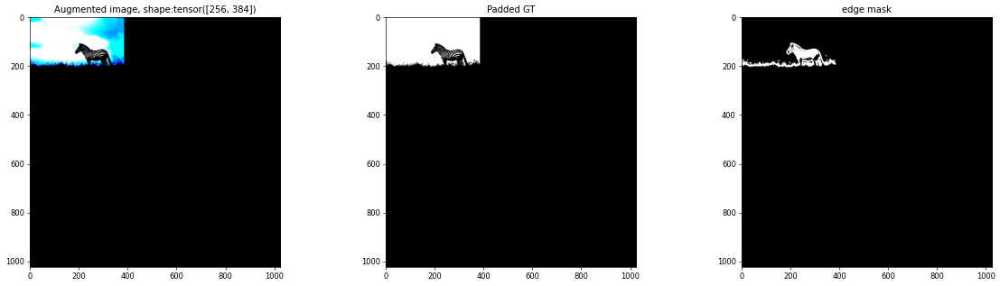

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


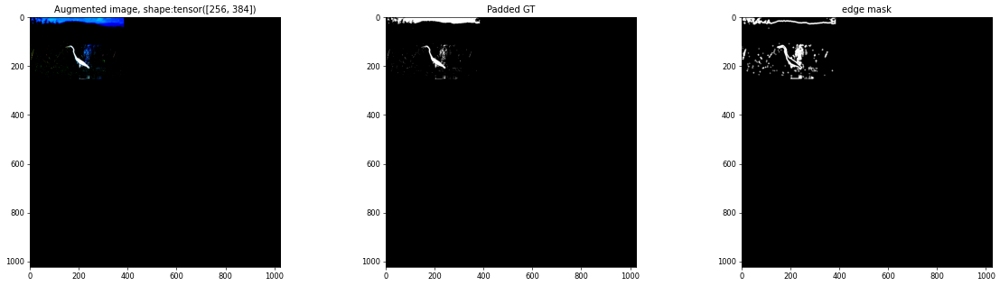

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


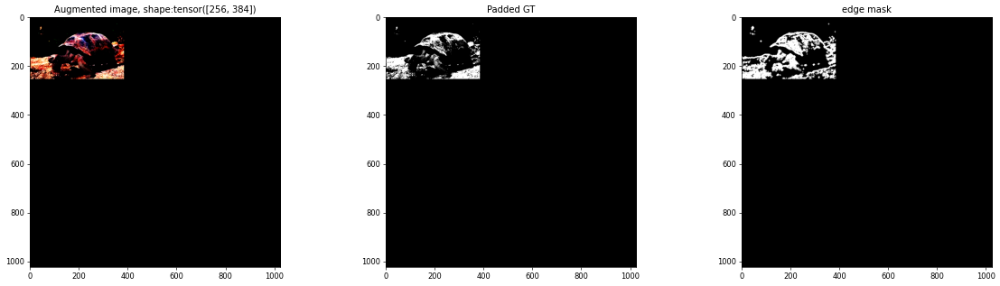

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


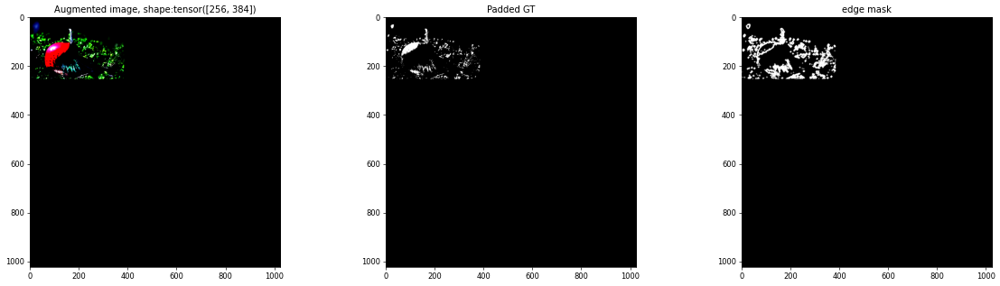

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


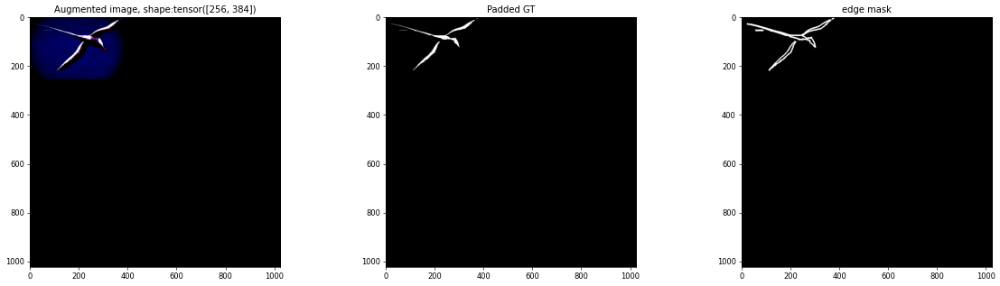

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


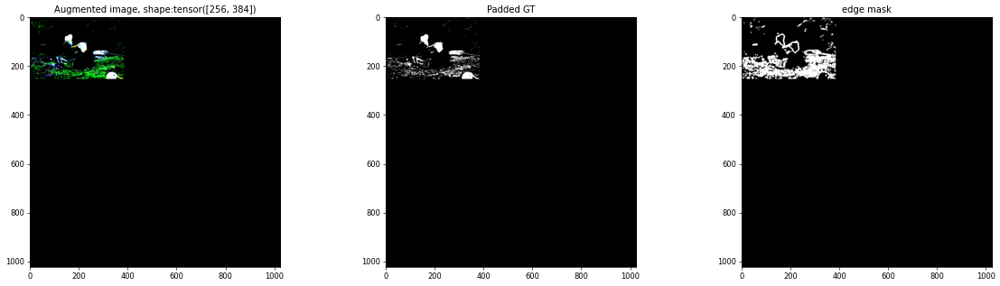

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


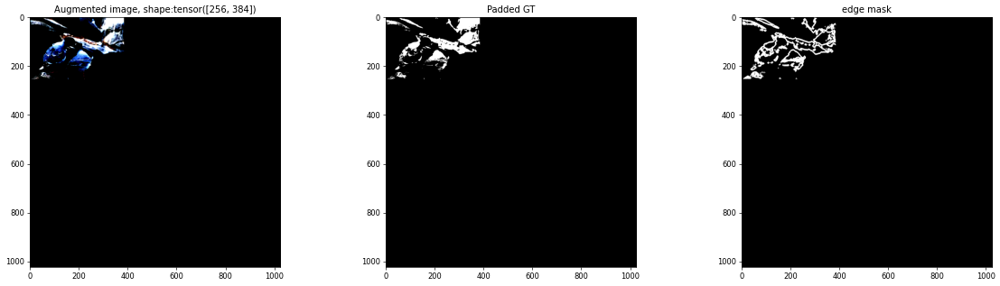

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


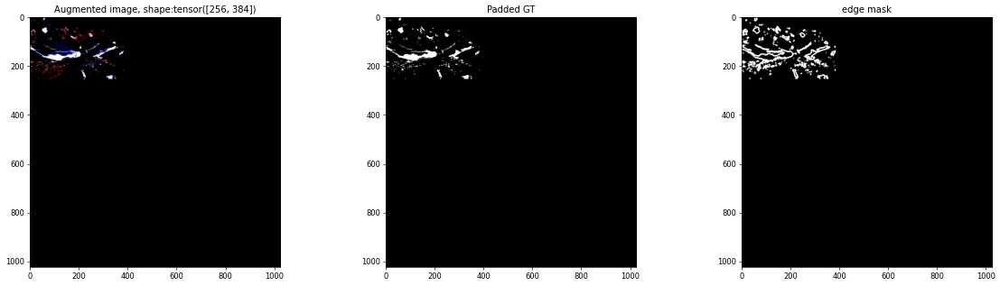

In [4]:
# Visualize after build-in transform (zero-padding and augmentations)
for img, gt, edge_mask, shape in dataset:
    plt.subplot(1, 3, 1)
    img = img.permute(1, 2, 0) # CHW -> HWC
    plt.imshow(img)
    plt.title(f"Augmented image, shape:{shape}")
    plt.subplot(1, 3, 2)
    gt = gt.permute(1, 2, 0) # CHW -> HWC
    plt.imshow(gt, cmap='gray')
    plt.title("Padded GT")
    plt.subplot(1, 3, 3)
    edge_mask = edge_mask.permute(1, 2, 0) # CHW -> HWC
    plt.imshow(edge_mask, cmap='gray')
    plt.title("edge mask")
    plt.show()

### Download the weights and init the IML-ViT model
You should download the pretrained weights from [Google Drive](https://drive.google.com/drive/folders/1Ztyiy2cKJVmyusYMUlwuyPecBefTJCPT?usp=sharing) or [Baidu NetDisk](https://pan.baidu.com/s/1IqyJdFLUo9bXEhvqOJkvvg?pwd=2k0o) and place it as `./checkpoints/iml-vit_checkpoint.pth`


**IMPORTANT NOTE**: The checkpoint your trained which obtained from `main_train.py` is organized in dictionary format, including many parameters such as model, optimizer, and so on. This leads to a size checkpoint over 1GB. Its format is roughly as follows:

```json
{
    "model": <state_dict of model>,
    "optimizer": <state_dict of model>,
    ......
}
```

However, to save space, demo.ipynb by default **only reads the model parameters**. The provided pretrained weights from online drive are also following this format. In other words, it expects to read a PyTorch checkpoint file that **only contains** an object of <state_dict of model>. 


You can strip the model `state_dict` from your customed trained checkpoint with following script:
```python
import torch
model = torch.load("/mnt/data0/xiaochen/workspace/IML-VIT/output_dir/checkpoint-150.pth")
output = model['model']
torch.save(output, "checkpoint-150.pth")
```


In [5]:
import torch
from iml_vit_model import iml_vit_model

# Check if GPU is available
device = 'cuda' if torch.cuda.is_available() else 'cpu'
# device = 'cpu' # if out of memory, then uncommenting this line

print("Device:", device)

# ckpt_path = "./checkpoints/iml-vit_checkpoint.pth"
ckpt_path = "D:/study_data/study/classes/3up/new_shot_class/homework/code/MIL-VIT/IML-ViT-main/IML-ViT-main/output_dir/checkpoint-4.pth"
model = iml_vit_model()

try:
    # try load offical released checkpoint 
    checkpoint = torch.load(ckpt_path)
    model.load_state_dict(checkpoint, strict=True)
    print("Official pretrained checkpoint loaded successfully.")
except Exception as e:
    print(f"Failed to load official checkpoint : {e}, try load 'torch.load(ckpt_path)['model']' instead.")
    try:
        # try load 'model' key from checkpoint
        checkpoint = torch.load(ckpt_path)['model']
        model.load_state_dict(checkpoint, strict=True)
        print("Custom checkpoint loaded successfully.")
    except Exception as e:
        print(f"Failed to load custom checkpoint: {e}")

# Move model to device
model = model.to(device)


d:\anaconda2\envs\vit\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
d:\anaconda2\envs\vit\lib\site-packages\timm\models\layers\__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


Device: cuda


C:\Users\salt salt\AppData\Local\Temp\ipykernel_2888\4075709508.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(ckpt_path)


Failed to load official checkpoint : Error(s) in loading state_dict for iml_vit_model:
	Missing key(s) in state_dict: "encoder_net.pos_embed", "encoder_net.patch_embed.proj.weight", "encoder_net.patch_embed.proj.bias", "encoder_net.blocks.0.norm1.weight", "encoder_net.blocks.0.norm1.bias", "encoder_net.blocks.0.attn.rel_pos_h", "encoder_net.blocks.0.attn.rel_pos_w", "encoder_net.blocks.0.attn.qkv.weight", "encoder_net.blocks.0.attn.qkv.bias", "encoder_net.blocks.0.attn.proj.weight", "encoder_net.blocks.0.attn.proj.bias", "encoder_net.blocks.0.norm2.weight", "encoder_net.blocks.0.norm2.bias", "encoder_net.blocks.0.mlp.fc1.weight", "encoder_net.blocks.0.mlp.fc1.bias", "encoder_net.blocks.0.mlp.fc2.weight", "encoder_net.blocks.0.mlp.fc2.bias", "encoder_net.blocks.1.norm1.weight", "encoder_net.blocks.1.norm1.bias", "encoder_net.blocks.1.attn.rel_pos_h", "encoder_net.blocks.1.attn.rel_pos_w", "encoder_net.blocks.1.attn.qkv.weight", "encoder_net.blocks.1.attn.qkv.bias", "encoder_net.blocks.1

C:\Users\salt salt\AppData\Local\Temp\ipykernel_2888\4075709508.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(ckpt_path)['model']


Custom checkpoint loaded successfully.


### Inference
This process require your GPU has at least 6GB of memory.

shape: tensor([428, 640])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:2.9130482995248954, including edge loss: 1.494467318294106, including class_loss: 0.316162109375,class_logits:tensor([0.9895], device='cuda:0')


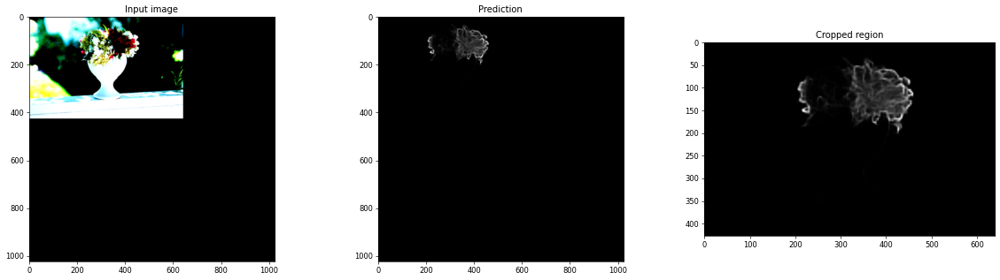

shape: tensor([425, 640])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:6.86723430382102, including edge loss: 6.223870214320453, including class_loss: 0.316650390625,class_logits:tensor([0.9875], device='cuda:0')


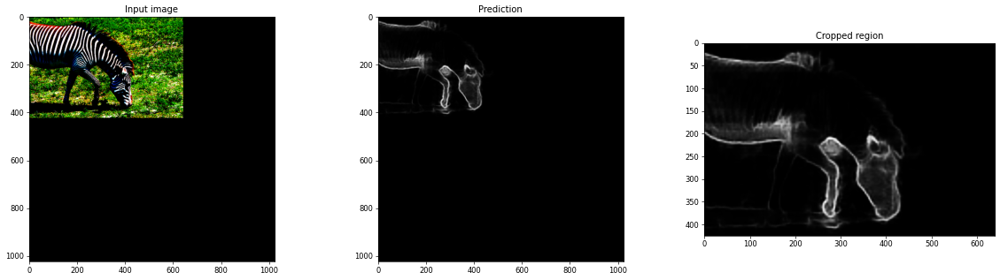

shape: tensor([600, 800])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:9.71092971520511, including edge loss: 7.9701227822431076, including class_loss: 0.3173828125,class_logits:tensor([0.9852], device='cuda:0')


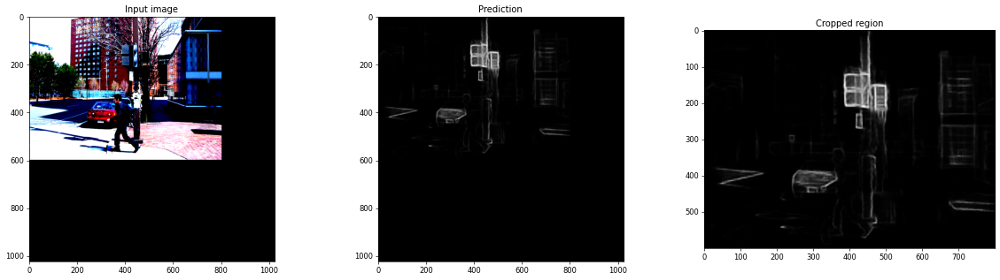

shape: tensor([704, 911])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:5.616316843535208, including edge loss: 0.4892634429093452, including class_loss: 0.316650390625,class_logits:tensor([0.9876], device='cuda:0')


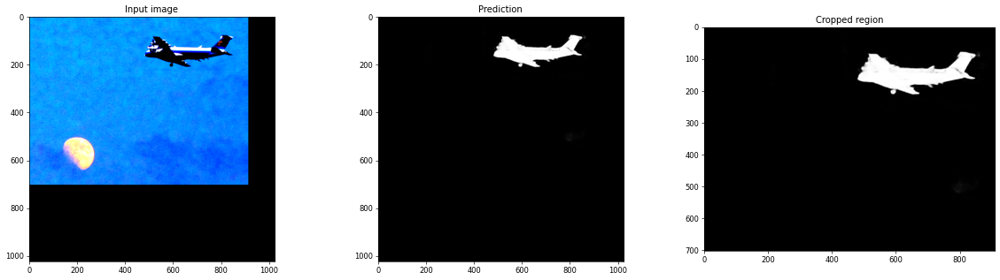

shape: tensor([704, 911])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:5.201376368677153, including edge loss: 0.4116815456401354, including class_loss: 0.31640625,class_logits:tensor([0.9883], device='cuda:0')


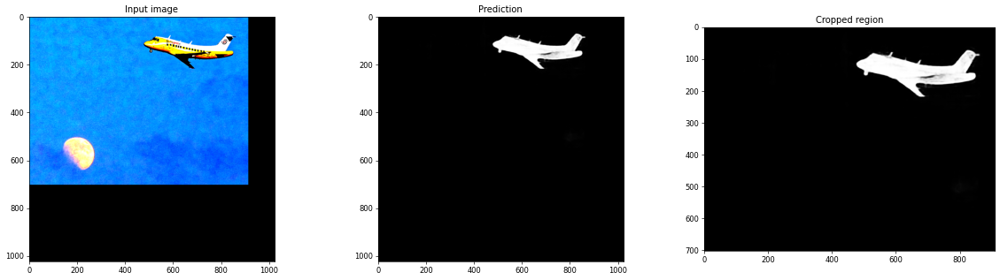

shape: tensor([600, 800])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:9.803564752187613, including edge loss: 8.047503636924915, including class_loss: 0.317138671875,class_logits:tensor([0.9855], device='cuda:0')


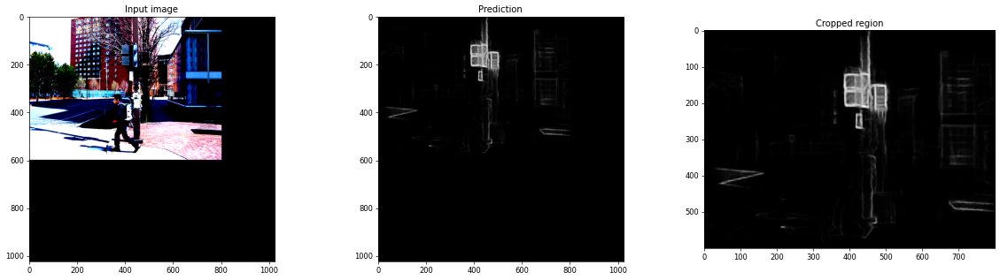

shape: tensor([480, 640])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:4.202483127100643, including edge loss: 2.955857394114716, including class_loss: 0.316650390625,class_logits:tensor([0.9876], device='cuda:0')


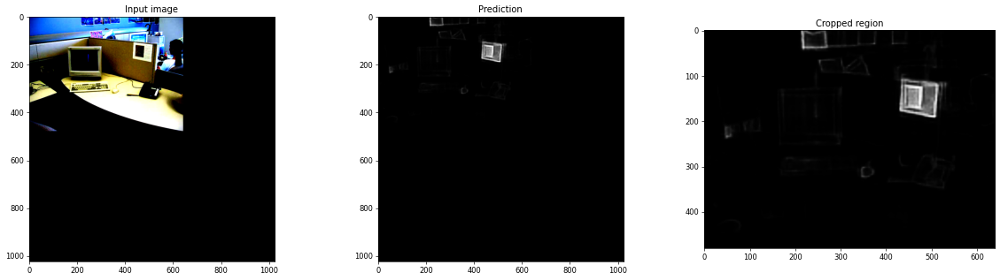

shape: tensor([480, 640])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:4.155409747656226, including edge loss: 2.917768072620026, including class_loss: 0.316650390625,class_logits:tensor([0.9877], device='cuda:0')


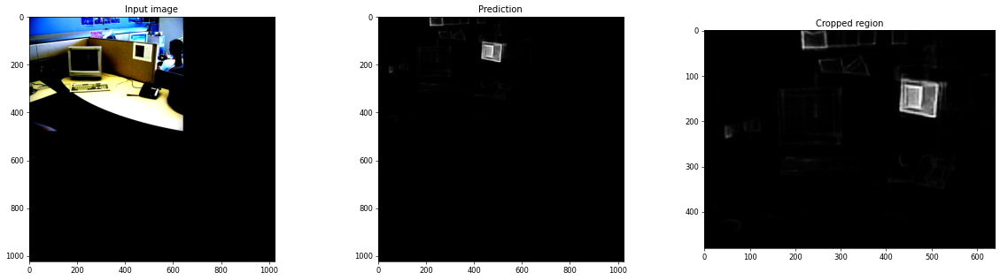

shape: tensor([1024,  683])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:8.874243684580978, including edge loss: 4.08533019729779, including class_loss: 0.317626953125,class_logits:tensor([0.9837], device='cuda:0')


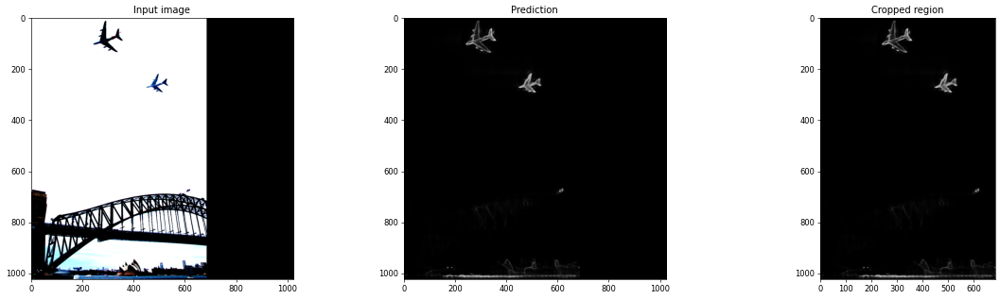

shape: tensor([1024,  683])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:9.069645272239706, including edge loss: 4.2428902021606785, including class_loss: 0.317626953125,class_logits:tensor([0.9839], device='cuda:0')


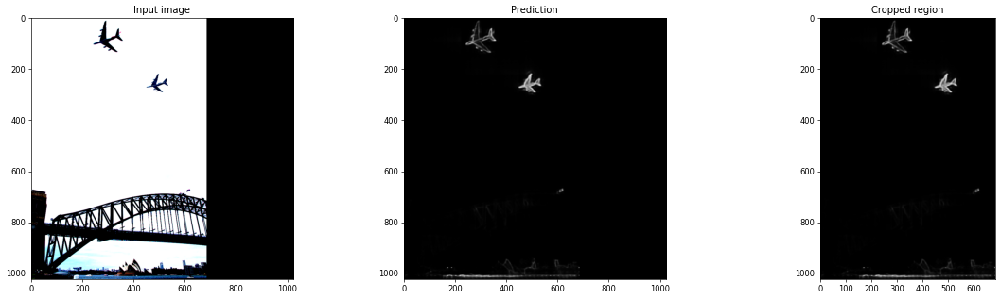

shape: tensor([512, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:7.500187930855893, including edge loss: 6.74640881424823, including class_loss: 0.316162109375,class_logits:tensor([0.9891], device='cuda:0')


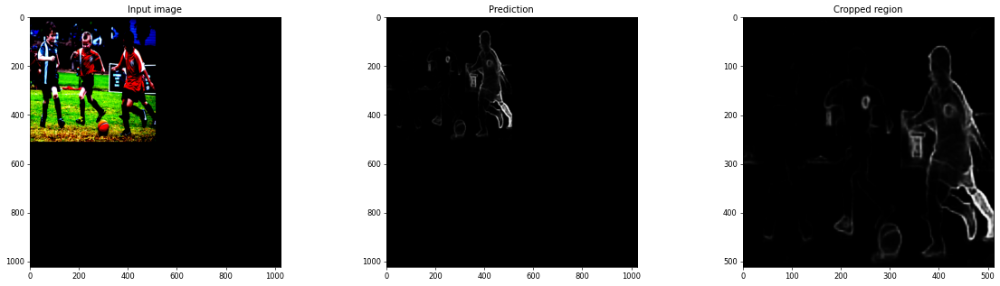

shape: tensor([512, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:7.366161255237509, including edge loss: 6.613970721411304, including class_loss: 0.316162109375,class_logits:tensor([0.9890], device='cuda:0')


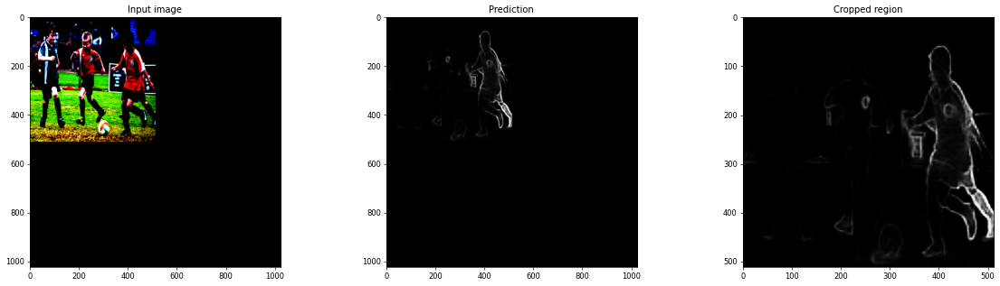

shape: tensor([512, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:7.497318030043064, including edge loss: 6.743849870891281, including class_loss: 0.316162109375,class_logits:tensor([0.9890], device='cuda:0')


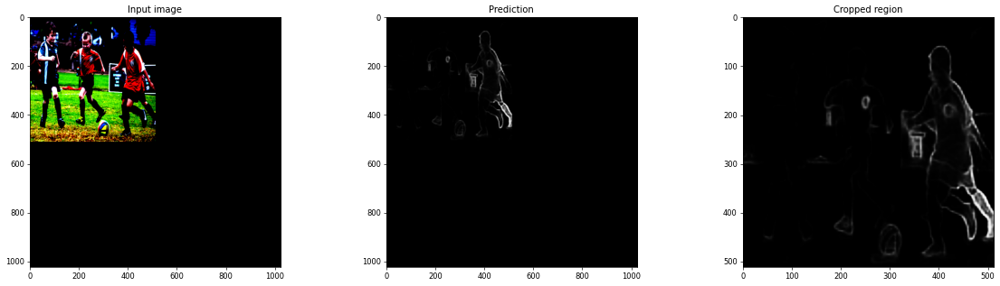

shape: tensor([512, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:7.310186668636044, including edge loss: 6.566853588149346, including class_loss: 0.316162109375,class_logits:tensor([0.9889], device='cuda:0')


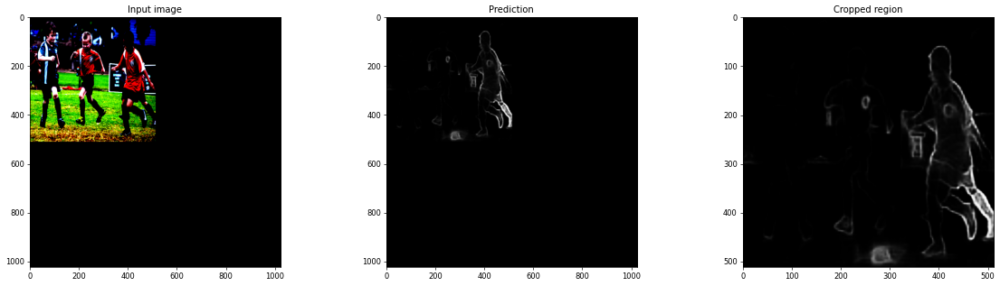

shape: tensor([512, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:3.256672965685464, including edge loss: 2.5786146908060736, including class_loss: 0.316650390625,class_logits:tensor([0.9878], device='cuda:0')


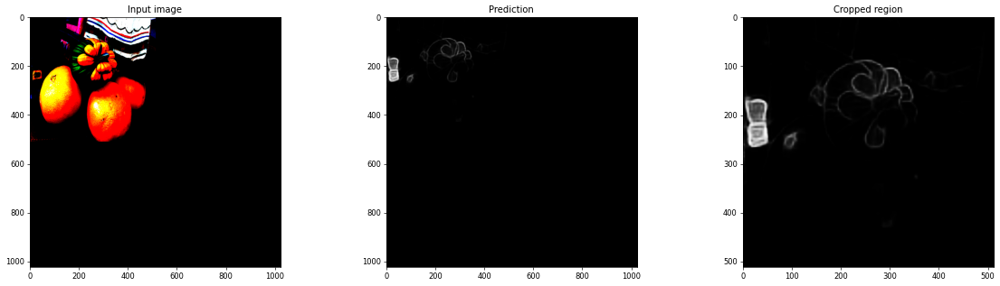

shape: tensor([256, 384])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:1.224527425419609, including edge loss: 0.4776555612187394, including class_loss: 0.316650390625,class_logits:tensor([0.9879], device='cuda:0')


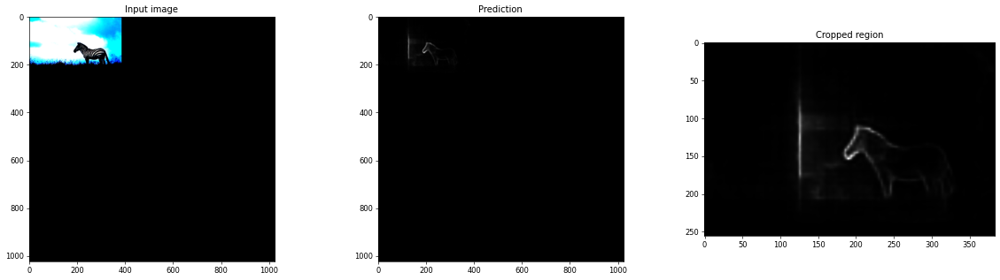

shape: tensor([256, 384])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:0.7511882351576418, including edge loss: 0.3730807538022418, including class_loss: 0.316650390625,class_logits:tensor([0.9879], device='cuda:0')


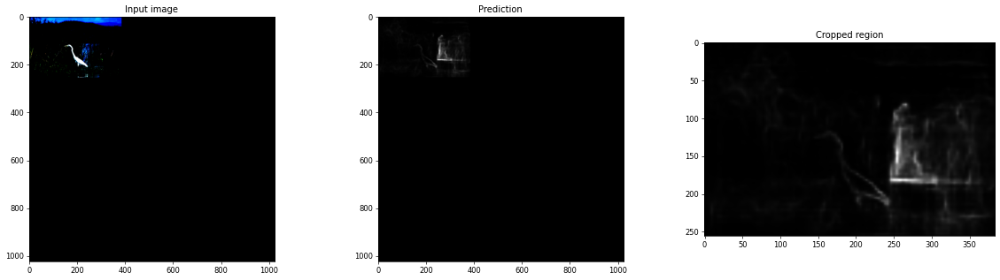

shape: tensor([256, 384])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:1.8608667092542248, including edge loss: 1.436021725980936, including class_loss: 0.316650390625,class_logits:tensor([0.9875], device='cuda:0')


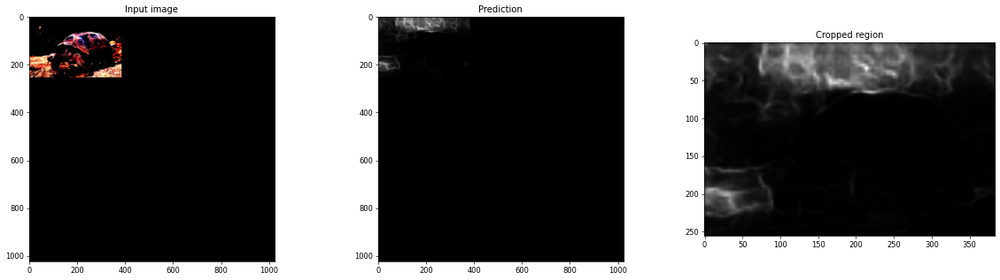

shape: tensor([256, 384])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:1.169905653784042, including edge loss: 0.8007166139270794, including class_loss: 0.316650390625,class_logits:tensor([0.9876], device='cuda:0')


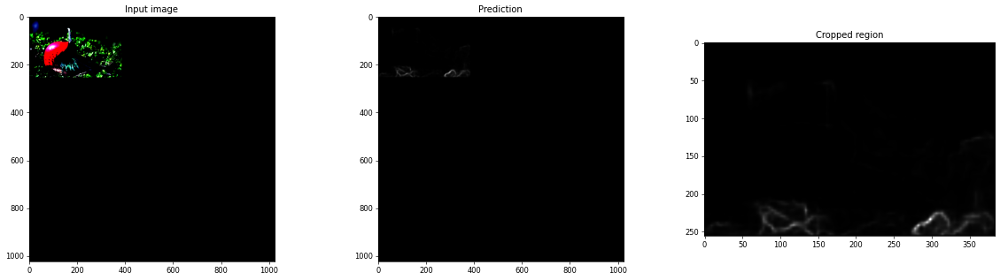

shape: tensor([256, 384])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:0.740662073431622, including edge loss: 0.3929388481628848, including class_loss: 0.316650390625,class_logits:tensor([0.9877], device='cuda:0')


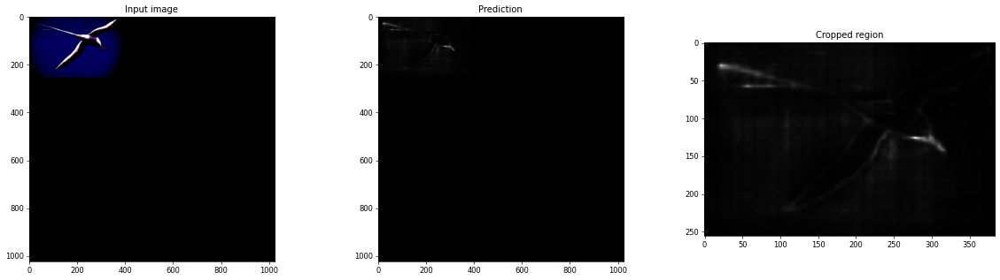

shape: tensor([256, 384])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:1.4525669970801438, including edge loss: 1.067100426642924, including class_loss: 0.316162109375,class_logits:tensor([0.9893], device='cuda:0')


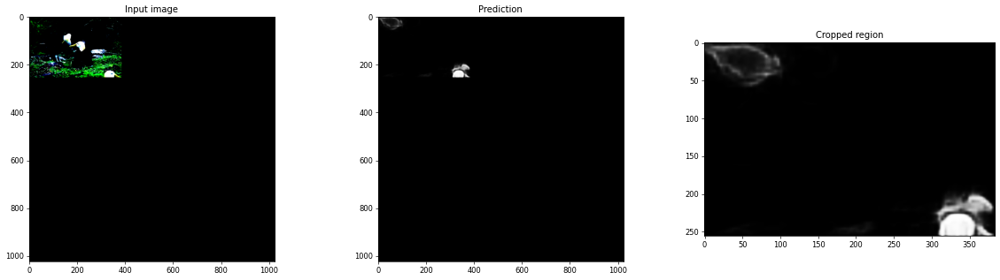

shape: tensor([256, 384])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:1.6191737513802922, including edge loss: 1.154399363162053, including class_loss: 0.31640625,class_logits:tensor([0.9882], device='cuda:0')


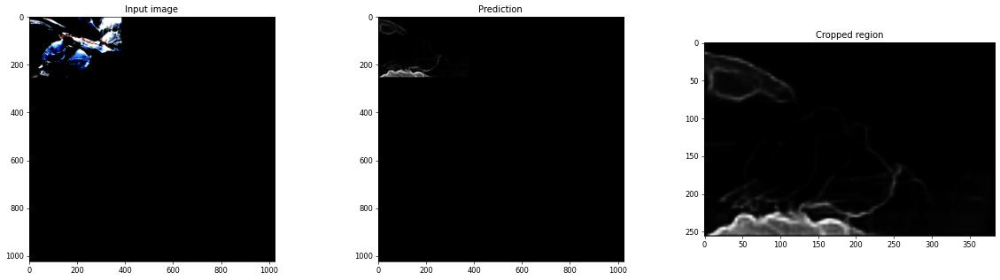

shape: tensor([256, 384])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict Loss:1.1177951038508702, including edge loss: 0.7431002223768246, including class_loss: 0.31640625,class_logits:tensor([0.9881], device='cuda:0')


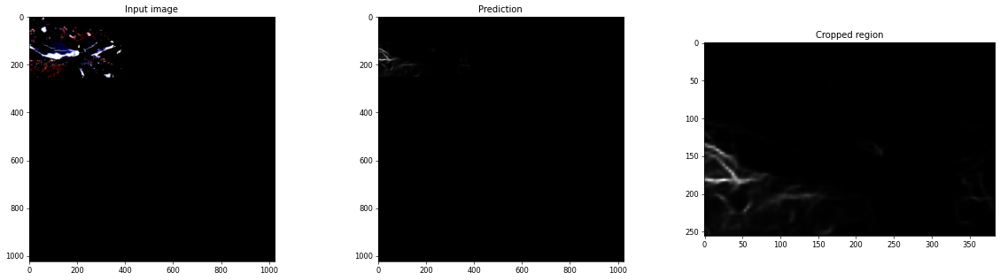

Done!


In [6]:
results = []
model.eval()
with torch.no_grad():
    for img, gt, edge_mask, shape in dataset:    # Inference don't need edge mask.
        img, gt, edge_mask = img.to(device), gt.to(device), edge_mask.to(device)
        # Since no Dataloader, manually create a Batch with size==1
        img = img.unsqueeze(0) # CHW -> 1CHW
        gt = gt.unsqueeze(0)
        edge_mask = edge_mask.unsqueeze(0)
        print("shape:", shape)
        # inference
        predict_loss, mask_pred, edge_loss,class_logits,class_loss = model(img, gt, edge_mask)
        print(f"Predict Loss:{predict_loss}, including edge loss: {edge_loss}, including class_loss: {class_loss},class_logits:{class_logits}")
        output = mask_pred
        
        # visualize
        plt.subplot(1, 3, 1)
        plt.title("Input image")
        plt.imshow(img[0].permute(1, 2, 0).cpu().numpy())
        plt.subplot(1, 3, 2)
        plt.title("Prediction")
        plt.imshow(output.cpu().numpy()[0][0], cmap='gray')


        # Cut the origin area from padded image
        output = output[0, :, 0:shape[0], 0:shape[1]].permute(1, 2, 0).cpu().numpy()
        results.append(output)
        plt.subplot(1, 3, 3)
        plt.title("Cropped region")
        plt.imshow(output, cmap='gray')
        plt.show()
print("Done!")

### Thresholding & comparison

In [7]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os

# Create a directory for saving the results if it doesn't exist
output_dir = r"D:/study_data/study/classes/3up/new_shot_class/homework/code/MIL-VIT/IML-ViT-main/IML-ViT-main/images/sample_iml_dataset/Output2"
os.makedirs(output_dir, exist_ok=True)

# Counter for file naming
counter = 1

# Visualize and save the results
for img_path, gt_path, res in zip(dataset.tp_path, dataset.gt_path, results):
    # Read the images
    img = mpimg.imread(img_path)
    gt = mpimg.imread(gt_path)

    # Ensure the result is 2D by squeezing unnecessary dimensions
    res = np.squeeze(res)  # Remove dimensions of size 1 (e.g., (428, 640, 1) -> (428, 640))
    thresholded = res > 0.5  # Apply thresholding

    # Create a figure for visualization
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 4, 1)
    plt.title("Tampered image")
    plt.imshow(img)
    
    plt.subplot(1, 4, 2)
    plt.title("Tampering Groundtruth")
    plt.imshow(gt, cmap="gray")
    
    plt.subplot(1, 4, 3)
    plt.title("Predict result")
    plt.imshow(res, cmap="gray")
    
    plt.subplot(1, 4, 4)
    plt.title("Result after thresholding")
    plt.imshow(thresholded, cmap="gray")

    # Save the 3rd and 4th subplot
    predict_result_path = os.path.join(output_dir, "predict", f"{str(counter).zfill(3)}.png")
    threshold_result_path = os.path.join(output_dir, "threshold", f"{str(counter).zfill(3)}.png")
    # Create subdirectories for predict and threshold
    os.makedirs(os.path.join(output_dir, "predict"), exist_ok=True)
    os.makedirs(os.path.join(output_dir, "threshold"), exist_ok=True)

    # Save images directly in grayscale
    plt.imsave(predict_result_path, res, cmap="gray", vmin=0, vmax=1)
    plt.imsave(threshold_result_path, thresholded, cmap="gray", vmin=0, vmax=1)

    print(f"Saved: {predict_result_path}")
    print(f"Saved: {threshold_result_path}")

    counter += 1
    plt.close()  # Close the figure to avoid memory issues


Saved: D:/study_data/study/classes/3up/new_shot_class/homework/code/MIL-VIT/IML-ViT-main/IML-ViT-main/images/sample_iml_dataset/Output2\predict\001.png
Saved: D:/study_data/study/classes/3up/new_shot_class/homework/code/MIL-VIT/IML-ViT-main/IML-ViT-main/images/sample_iml_dataset/Output2\threshold\001.png
Saved: D:/study_data/study/classes/3up/new_shot_class/homework/code/MIL-VIT/IML-ViT-main/IML-ViT-main/images/sample_iml_dataset/Output2\predict\002.png
Saved: D:/study_data/study/classes/3up/new_shot_class/homework/code/MIL-VIT/IML-ViT-main/IML-ViT-main/images/sample_iml_dataset/Output2\threshold\002.png
Saved: D:/study_data/study/classes/3up/new_shot_class/homework/code/MIL-VIT/IML-ViT-main/IML-ViT-main/images/sample_iml_dataset/Output2\predict\003.png
Saved: D:/study_data/study/classes/3up/new_shot_class/homework/code/MIL-VIT/IML-ViT-main/IML-ViT-main/images/sample_iml_dataset/Output2\threshold\003.png
Saved: D:/study_data/study/classes/3up/new_shot_class/homework/code/MIL-VIT/IML-Vi

In [ ]:
import os
import re

def rename_files_to_fixed_width(folder_path, extension="png", width=3):
    """
    遍历文件夹并将文件名的数字部分格式化为固定宽度格式。
    
    :param folder_path: 文件夹路径
    :param extension: 文件扩展名（默认为 "png"）
    :param width: 文件名数字部分的宽度（默认为 3，即 "001"）
    """
    # 获取文件夹中所有指定扩展名的文件
    files = [f for f in os.listdir(folder_path) if f.endswith(f".{extension}")]
    
    # 使用正则提取文件名中的数字部分并排序
    files.sort(key=lambda x: int(re.search(r'/d+', x).group()))
    
    # 遍历文件并重命名
    for file in files:
        # 提取原始文件路径
        old_path = os.path.join(folder_path, file)
        
        # 提取文件名中的数字部分
        match = re.search(r'(/d+)', file)
        if match:
            original_number = match.group()
            new_number = str(original_number).zfill(width)  # 格式化数字部分
            new_name = file.replace(original_number, new_number)  # 替换文件名中的数字部分
            new_path = os.path.join(folder_path, new_name)
            
            # 重命名文件
            os.rename(old_path, new_path)
            print(f"重命名: {old_path} -> {new_path}")

# 示例用法
if __name__ == "__main__":
    folder_path = r"D:/study_data/study/classes/3up/new_shot_class/homework/code/MIL-VIT/IML-ViT-main/IML-ViT-main/images/sample_iml_dataset/1Gt"
    rename_files_to_fixed_width(folder_path)



In [ ]:
import os
from PIL import Image

def convert_images_to_png(input_dir, output_dir):
    """
    将文件夹中的所有图像转换为 PNG 格式，并保存到新的文件夹中。

    :param input_dir: 输入文件夹路径
    :param output_dir: 输出文件夹路径
    """
    # 确保输出文件夹存在
    os.makedirs(output_dir, exist_ok=True)
    
    # 遍历输入文件夹中的所有文件
    for filename in os.listdir(input_dir):
        file_path = os.path.join(input_dir, filename)
        
        # 检查是否是图像文件
        if filename.lower().endswith(('.jpg', '.jpeg', '.bmp', '.gif', '.png')):
            try:
                # 打开图像
                with Image.open(file_path) as img:
                    # 将文件名更改为 .png 格式
                    output_file = os.path.splitext(filename)[0] + ".png"
                    output_path = os.path.join(output_dir, output_file)
                    
                    # 转换并保存为 PNG
                    img.convert("RGBA").save(output_path, "PNG")
                    print(f"已保存: {output_path}")
            except Exception as e:
                print(f"处理 {file_path} 时出错: {e}")

# 示例：调用函数
input_folder =r"D:/study_data/study/classes/3up/new_shot_class/homework/code/MIL-VIT/IML-ViT-main/IML-ViT-main/images/sample_iml_dataset/Gt"  # 输入文件夹路径
output_folder = r"D:/study_data/study/classes/3up/new_shot_class/homework/code/MIL-VIT/IML-ViT-main/IML-ViT-main/images/sample_iml_dataset/Gt"  # 输出文件夹路径
convert_images_to_png(input_folder, output_folder)
